In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
import tensorflow as tf

In [2]:
import os
import random
import numpy as np
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Sequential
from tensorflow.keras.initializers import GlorotNormal
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization,GlobalAveragePooling2D

from keras.models import load_model
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.preprocessing.image import load_img, img_to_array

from sklearn.metrics import confusion_matrix

import warnings
warnings.filterwarnings('ignore')

In [3]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("vipoooool/new-plant-diseases-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/new-plant-diseases-dataset


In [4]:
train_dir = 'New Plant Diseases Dataset(Augmented)/train/'
test_dir = 'New Plant Diseases Dataset(Augmented)/valid/'

In [2]:
s=224

In [4]:
strategy = tf.distribute.MirroredStrategy()

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)


In [5]:
print('Number of devices: {}'.format(strategy.num_replicas_in_sync))

Number of devices: 1


In [8]:
train_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    validation_split=0.1,
).flow_from_directory(train_dir,
                      batch_size=16,
                      target_size=(s,s),
                      subset="training",
                      color_mode='rgb',
                      class_mode='categorical',
                      shuffle=True)

Found 63282 images belonging to 38 classes.


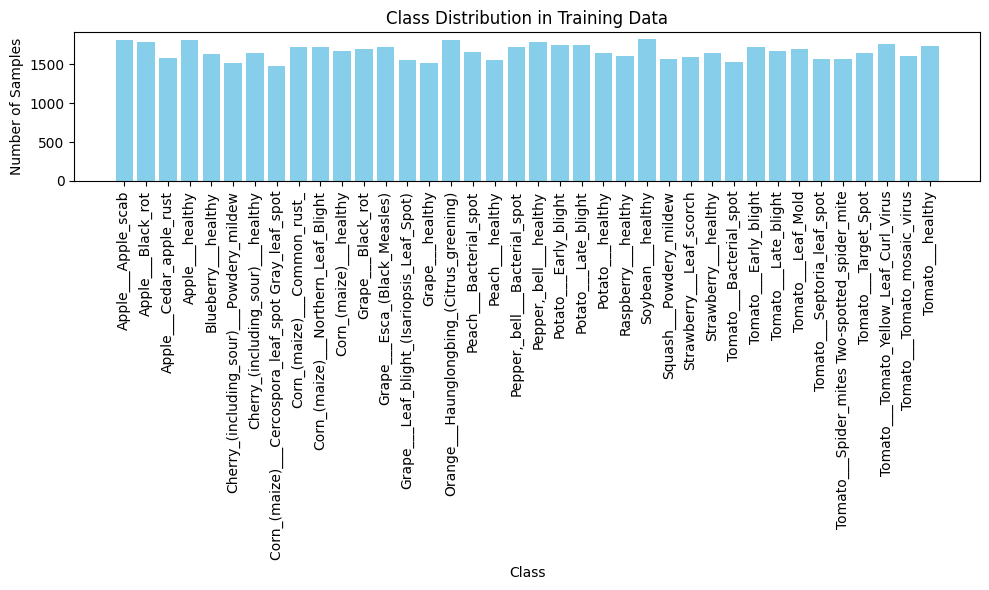

In [9]:
class_labels = list(train_generator.class_indices.keys())
class_counts = np.bincount(train_generator.classes)

plt.figure(figsize=(10, 6))
plt.bar(class_labels, class_counts, color='skyblue')
plt.title('Class Distribution in Training Data')
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

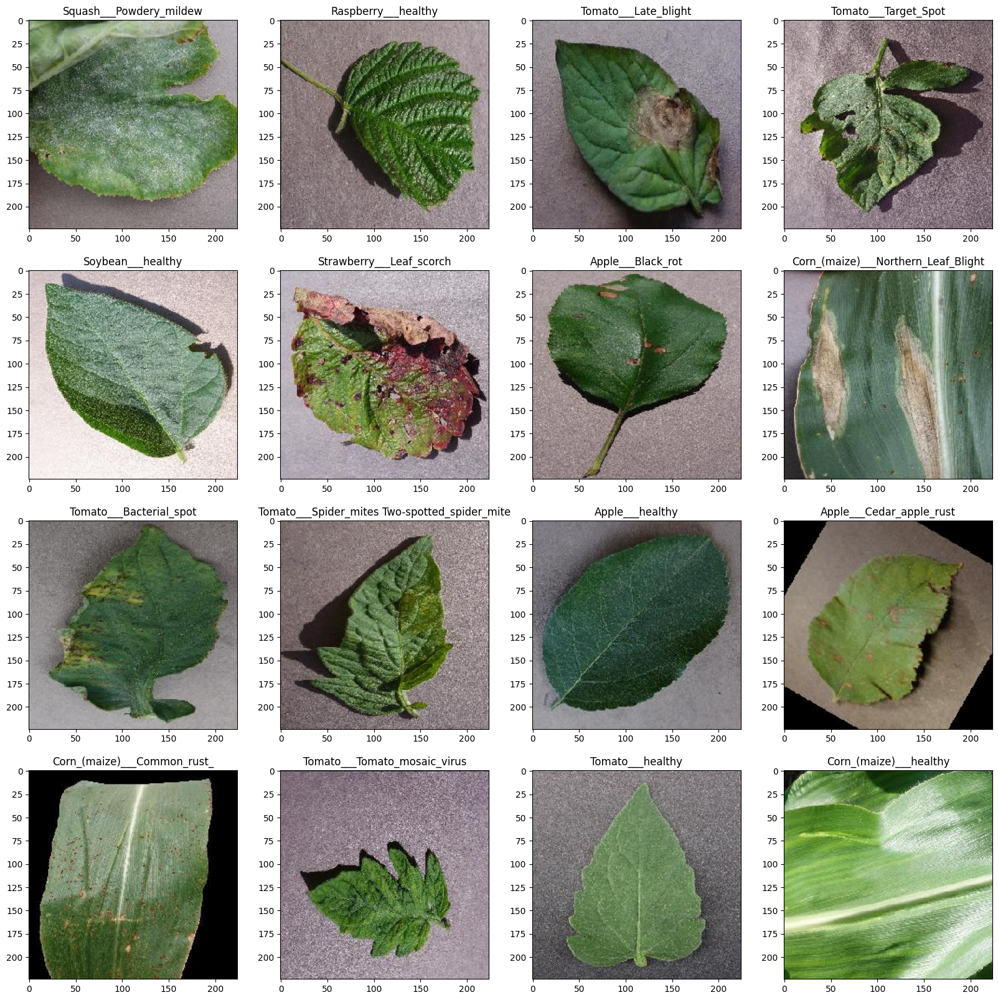

In [10]:
classes=list(train_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in train_generator:
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])
    plt.show()
    break

In [11]:
valid_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    validation_split=0.1,
).flow_from_directory(train_dir,
                      batch_size=16,
                      target_size=(s,s),
                      subset='validation',
                      color_mode='rgb',
                      class_mode='categorical',
                      shuffle=False)

Found 7013 images belonging to 38 classes.


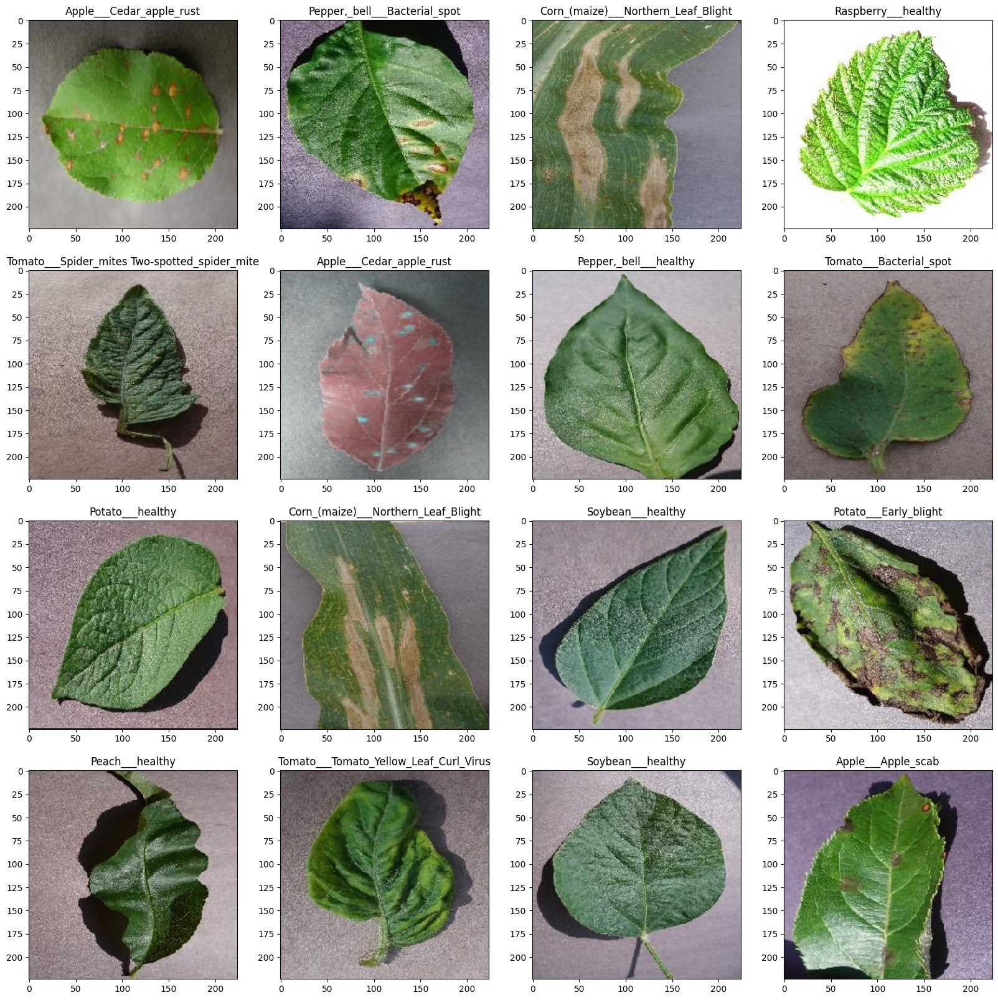

In [12]:
classes=list(train_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in train_generator:
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])
    plt.show()
    break

In [13]:
test_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
).flow_from_directory(test_dir,
                      batch_size=16,
                      target_size=(s,s),
                      color_mode='rgb',
                      class_mode='categorical',
                      shuffle=False)

Found 17572 images belonging to 38 classes.


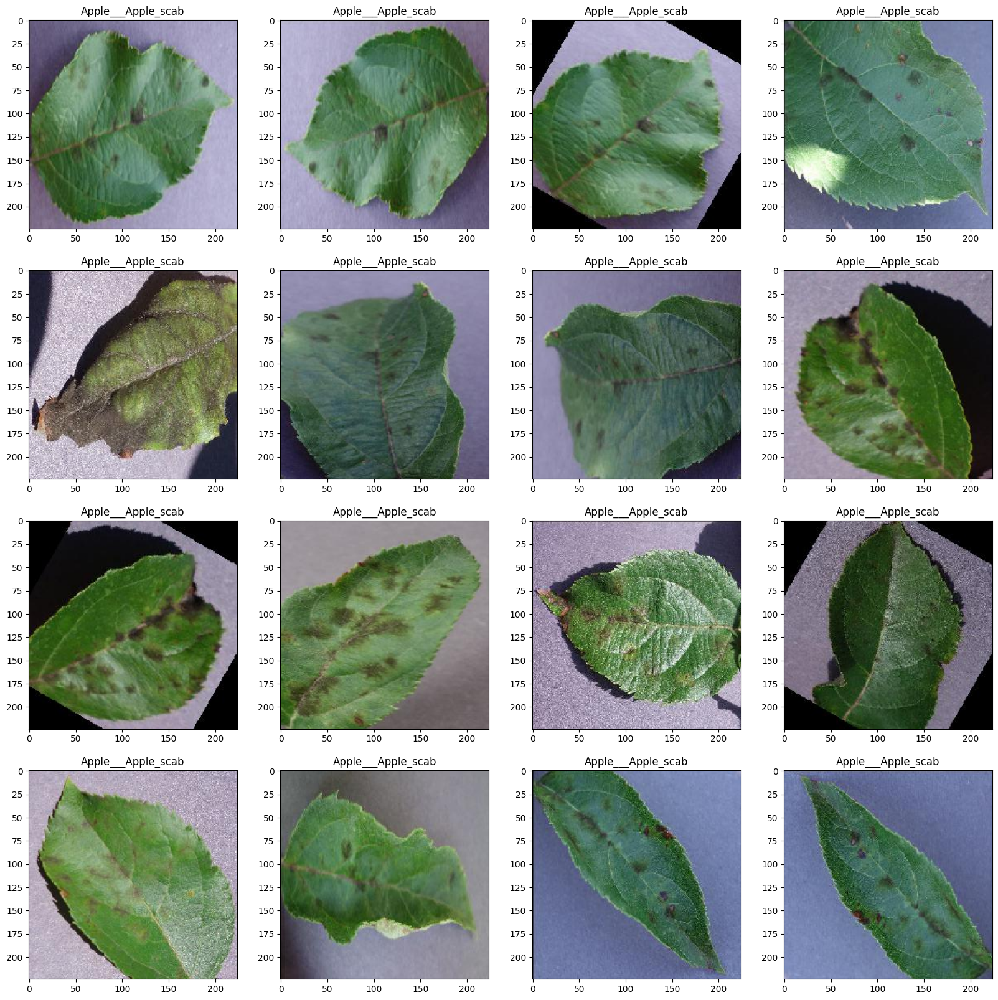

In [14]:
classes=list(train_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in test_generator:
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])
    plt.show()
    break

# Train Model

In [15]:
def Evaluate_model(model, train_generator, valid_generator, test_generator):
    model_evaluate_train = model.evaluate(train_generator)
    print("Loss of Train       : ",model_evaluate_train[0])
    print("Accuracy of Train   : ",model_evaluate_train[1])
    print("Precision of Train  : ",model_evaluate_train[2])
    print("Recall of Train     : ",model_evaluate_train[3])
    
    model_evaluate_valid = model.evaluate(valid_generator)
    print("Loss of Validation      : ",model_evaluate_valid[0])
    print("Accuracy of Validation  : ",model_evaluate_valid[1])
    print("Precision of Validation : ",model_evaluate_valid[2])
    print("Recall of Validation    : ",model_evaluate_valid[3])
    
    model_evaluate_test = model.evaluate(test_generator)
    print("Loss of Test      : ",model_evaluate_test[0])
    print("Accuracy of Test  : ",model_evaluate_test[1])
    print("Precision of Test : ",model_evaluate_test[2])
    print("Recall of Test    : ",model_evaluate_test[3])
    
    return np.round(model_evaluate_train[0], 2), np.round(model_evaluate_valid[0], 2), np.round(model_evaluate_test[0], 2), \
           np.round(model_evaluate_train[1], 2), np.round(model_evaluate_valid[1], 2), np.round(model_evaluate_test[1], 2), \
           np.round(model_evaluate_train[2], 2), np.round(model_evaluate_valid[2], 2), np.round(model_evaluate_test[2], 2), \
           np.round(model_evaluate_train[3], 2), np.round(model_evaluate_valid[3], 2), np.round(model_evaluate_test[3], 2)

In [16]:
def draw_plots(model):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    precision = history.history['precision']
    val_precision = history.history['val_precision']

    recall =history.history['recall']
    val_recall =history.history['val_recall']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)
    
    fig, ax = plt.subplots(2, 2, figsize=(17, 12))
    step = 2
    
    # Accuracy
    ax[0][0].plot(epochs, acc, color='green', label='Training Accuracy')
    ax[0][0].plot(epochs, val_acc, color='blue', label='Validation Accuracy')
    ax[0][0].set_title('Training and Validation Accuracy')
    ax[0][0].set_ylabel('Accuracy')
    ax[0][0].set_xlabel('Epoch')
    ax[0][0].legend()
    ax[0][0].set_xticks(np.arange(0, len(epochs) + step, step))
    ax[0][0].set_ylim(0, 1.02)
    
    # Precision
    ax[0][1].plot(epochs, precision, color='green', label='Training precision')
    ax[0][1].plot(epochs, val_precision, color='red', label='Validation precision')
    ax[0][1].set_title('Training and Validation precision')
    ax[0][1].set_xlabel('Epoch')
    ax[0][1].set_ylabel('precision')
    ax[0][1].legend()
    ax[0][1].set_xticks(np.arange(0, len(epochs) + step, step))
    ax[0][1].set_ylim(0,1.02)
    
    # Recall
    ax[1][0].plot(epochs, recall, color='green', label='Training Recall')
    ax[1][0].plot(epochs, val_recall, color='red', label='Validation Recall')
    ax[1][0].set_title('Training and Validation Recall')
    ax[1][0].set_xlabel('Epoch')
    ax[1][0].set_ylabel('Recall')
    ax[1][0].legend()
    ax[1][0].set_xticks(np.arange(0, len(epochs) + step, step))
    ax[1][0].set_ylim(0,1.02)
    
    # Loss
    ax[1][1].plot(epochs, loss, color='green', label='Training Loss')
    ax[1][1].plot(epochs, val_loss, color='red', label='Validation Loss')
    ax[1][1].set_title('Training and Validation Loss')
    ax[1][1].set_xlabel('Epoch')
    ax[1][1].set_ylabel('Loss')
    ax[1][1].legend()
    ax[1][1].set_xticks(np.arange(0, len(epochs) + step, step))
    
    plt.show()

In [17]:
def Pridect_images (model, pred_dir, class_names):
    a=0
    for img in os.listdir(pred_dir):
        path = os.path.join(pred_dir, img)
        H,W,C = 224,224,3
        img = cv2.imread(path)
        img = cv2.resize(img, (H, W)) 
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
        img = np.array(img)
        img = img.astype("float32")  
        img = img / 255.0
        plt.imshow(img)
        img = np.expand_dims(img, axis=0)
        prediction = np.argmax(model.predict(img),axis=-1)[0]
        plt.title(f"predict : {class_names[prediction]}")
        plt.show()
        a+=1
        if a==5:
            break

# CNN

In [18]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D, Input
from keras.models import Model

with strategy.scope():
    input_shape = (224, 224, 3)
    model_CNN = Sequential([
    tf.keras.layers.Conv2D(128, (3,3), activation='relu', input_shape = input_shape,padding="same"),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(256, (3,3), activation='relu',padding="same"),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(512, (3,3), activation='relu',padding="same"),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(256, (3,3), activation='relu',padding="same"),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(38, activation='softmax')
    ])
    
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999)
    
    model_CNN.compile(optimizer= optimizer, loss="categorical_crossentropy", metrics=["accuracy",'precision','recall'])

model_CNN.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 224, 224, 128)       │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 256)       │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 256)         │       1,179,904 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 50176)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 50176)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1024)                │      51,381,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 38)                  │          19,494 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 54,584,358 (208.22 MB)

 Trainable params: 54,584,358 (208.22 MB)

 Non-trainable params: 0 (0.00 B)

In [19]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

callbacks=[early_stopping,model_checkpoint]

In [20]:
history = model_CNN.fit(train_generator,
                    epochs = 8,
                    batch_size=16,
                    validation_data = valid_generator,
                    callbacks = callbacks
                    )

Epoch 1/8
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 601s 148ms/step - accuracy: 0.3268 - loss: 2.4160 - precision: 0.6809 - recall: 0.1965 - val_accuracy: 0.8306 - val_loss: 0.5759 - val_precision: 0.8901 - val_recall: 0.7670
Epoch 2/8
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 580s 147ms/step - accuracy: 0.8078 - loss: 0.6149 - precision: 0.8689 - recall: 0.7511 - val_accuracy: 0.8979 - val_loss: 0.3243 - val_precision: 0.9290 - val_recall: 0.8734
Epoch 3/8
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 578s 146ms/step - accuracy: 0.8872 - loss: 0.3580 - precision: 0.9169 - recall: 0.8617 - val_accuracy: 0.9224 - val_loss: 0.2385 - val_precision: 0.9436 - val_recall: 0.9056
Epoch 4/8
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 578s 146ms/step - accuracy: 0.9203 - loss: 0.2508 - precision: 0.9375 - recall: 0.9044 - val_accuracy: 0.9358 - val_loss: 0.1974 - val_precision: 0.9478 - val_recall: 0.9261
Epoch 5/8
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 577s 146ms/step - accuracy: 0.9403 - loss: 0.1878 - precision: 0.9512 - recall: 0.9303 - val_accura

In [21]:
Report_CNN = []
Report_CNN.append(Evaluate_model(model_CNN, train_generator, valid_generator, test_generator))
Report_CNN

3956/3956 ━━━━━━━━━━━━━━━━━━━━ 224s 57ms/step - accuracy: 0.9912 - loss: 0.0289 - precision: 0.9926 - recall: 0.9899
Loss of Train       :  0.027986222878098488
Accuracy of Train   :  0.9914035797119141
Precision of Train  :  0.9925841689109802
Recall of Train     :  0.9898549318313599
439/439 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step - accuracy: 0.9728 - loss: 0.0850 - precision: 0.9762 - recall: 0.9690
Loss of Validation      :  0.12486281245946884
Accuracy of Validation  :  0.9606501460075378
Precision of Validation :  0.9668492078781128
Recall of Validation    :  0.9563729763031006
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 127s 116ms/step - accuracy: 0.9743 - loss: 0.0821 - precision: 0.9772 - recall: 0.9712
Loss of Test      :  0.09912984073162079
Accuracy of Test  :  0.9687002301216125
Precision of Test :  0.9717987179756165
Recall of Test    :  0.9648303985595703


[(0.03, 0.12, 0.1, 0.99, 0.96, 0.97, 0.99, 0.97, 0.97, 0.99, 0.96, 0.96)]

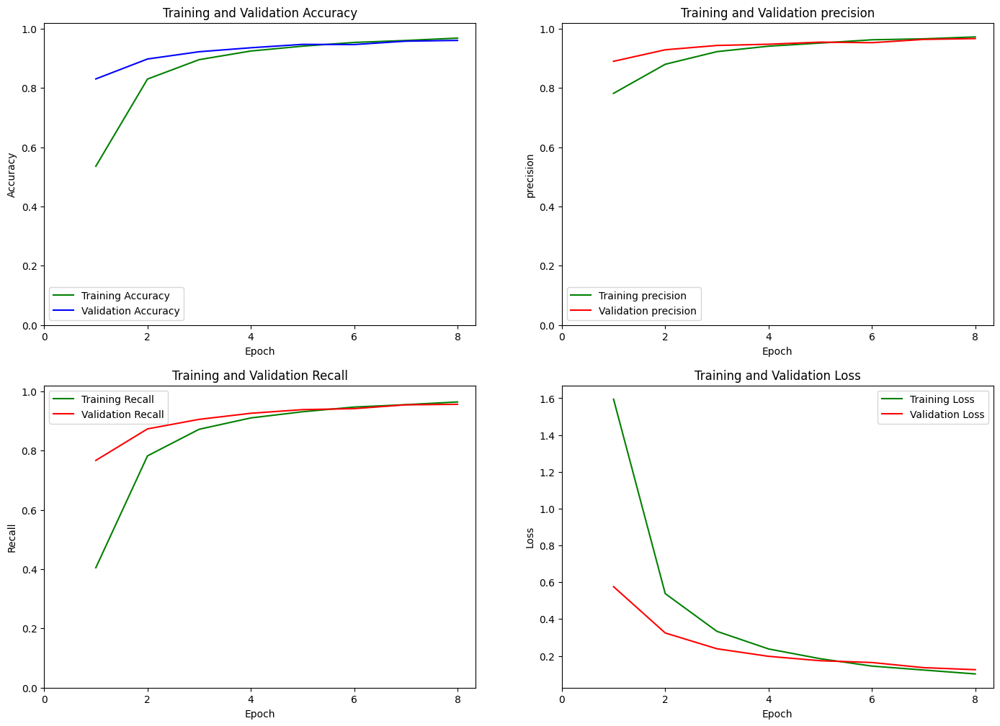

In [22]:
draw_plots(model_CNN)

1099/1099 ━━━━━━━━━━━━━━━━━━━━ 54s 49ms/step
Classification report : 
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.98      0.95      0.96       504
                                 Apple___Black_rot       0.99      1.00      0.99       497
                          Apple___Cedar_apple_rust       0.97      1.00      0.98       440
                                   Apple___healthy       0.97      0.98      0.98       502
                               Blueberry___healthy       0.97      0.99      0.98       454
          Cherry_(including_sour)___Powdery_mildew       1.00      0.99      0.99       421
                 Cherry_(including_sour)___healthy       0.97      1.00      0.98       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.99      0.82      0.89       410
                       Corn_(maize)___Common_rust_       1.00      0.99      0.99       477
        

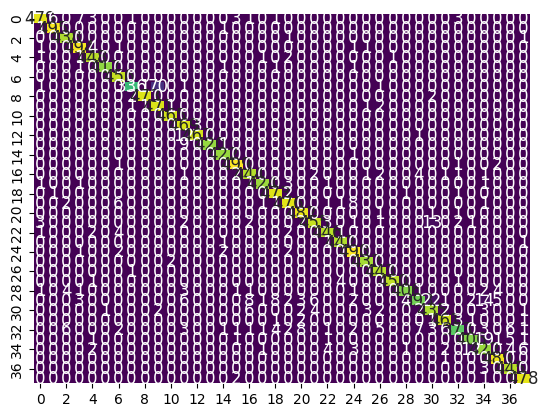

Normalized confusion matrix : 



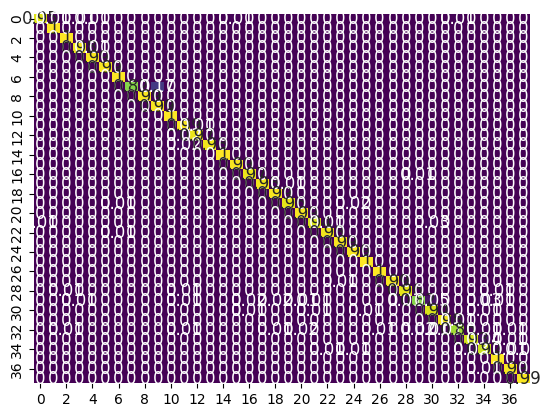

In [23]:
from sklearn.metrics import classification_report, confusion_matrix

predictions = model_CNN.predict(test_generator)

y_pred = predictions.argmax(axis=-1)

class_names = list(test_generator.class_indices.keys())

print("Classification report : \n",classification_report(test_generator.labels, y_pred, target_names = class_names))

def draw_confusion_matrix(true, preds, normalize=None):
    conf_matx = confusion_matrix(true, preds, normalize = normalize)
    conf_matx = np.round(conf_matx, 2)

    sns.heatmap(conf_matx, annot=True, annot_kws={"size": 12},fmt="g", cbar=False, cmap="viridis")
    plt.show()

print("Confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred)

print("Normalized confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred, "true")

In [24]:
model_CNN.save('plant_disease_model_1_latest.pt')

In [25]:
model_CNN_load = tf.keras.models.load_model("plant_disease_model_1_latest.pt")

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


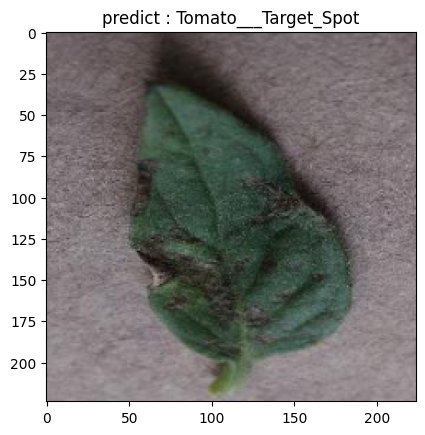

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


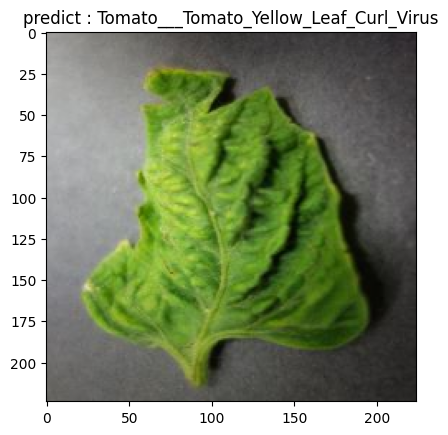

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


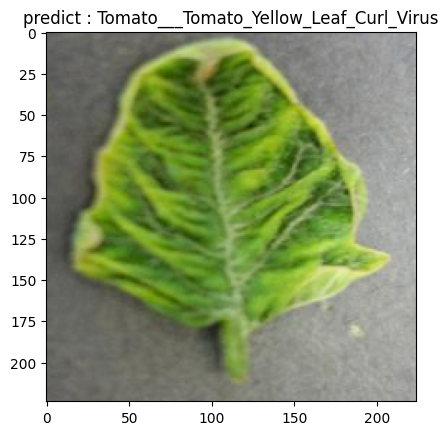

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


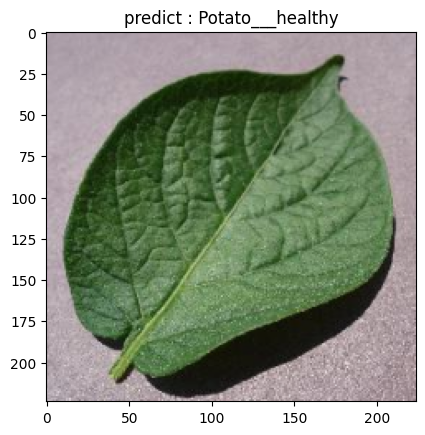

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


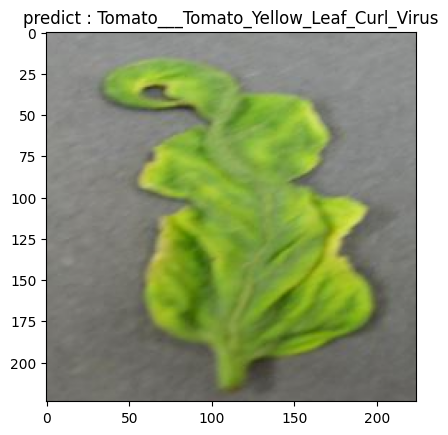

In [26]:
pred_dir = 'new-plant-diseases-dataset/test/test'
class_names = list(test_generator.class_indices.keys())
Pridect_images (model_CNN_load, pred_dir, class_names)